# Skin Cancer Detection from Smartphone Imagery using Convolutional Neural Network
#### College of Computing, Prince of Songkla University, Phuket Campus

---
[PAD-UFES-20](https://www.sciencedirect.com/science/article/pii/S235234092031115X) (images collected from smartphones)

In [1]:
#import packages
import os
import cv2
import shutil
import zipfile
import datetime
import itertools
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from tqdm import tqdm
from enum import Enum
from random import sample
from tensorflow import keras
from patchify import patchify
from keras_unet_collection import models
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import plot_confusion_matrix
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping,ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import load_img,img_to_array,ImageDataGenerator
from tensorflow.keras.layers import Dense,Flatten,Dropout,Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose

2022-11-29 09:42:53.989843: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# Unzipping files PAD-UFES-20 (images collected from smartphones)
if not os.path.exists('./PAD-UFES-20 (images collected from smartphones)'):
    with zipfile.ZipFile('./PAD-UFES-20 (images collected from smartphones).zip', 'r') as zip_ref:
        zip_ref.extractall('./')

In [3]:
#directory Skin Cancer
old_Directory = './PAD-UFES-20 (images collected from smartphones)/images'
Directory = './New_PAD-UFES-20/'
Target = './Target_PAD-UFES-20/'
Checkpoint = './Checkpoint/'
Threshold = './Threshold-img/'
#create directory folder
if not os.path.exists(Directory):
    os.makedirs(Directory)
if not os.path.exists(Target):
    os.makedirs(Target)
if not os.path.exists(Checkpoint):
    os.makedirs(Checkpoint)
if not os.path.exists(Threshold):
    os.makedirs(Threshold)


In [4]:
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.compat.v1.Session(config=config)

print( 'Tensorflow Version:', tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2022-11-29 09:43:13.234887: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-29 09:43:13.241769: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-11-29 09:43:13.243642: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-29 09:43:13.244151: I tensorflow/core/common_runtime/pluggable_device/plug

Metal device set to: AMD Radeon Pro 5500M

systemMemory: 16.00 GB
maxCacheSize: 1.99 GB

Tensorflow Version: 2.10.0
Num GPUs Available:  1


In [5]:
metadata_skin_cancer = pd.read_csv('./PAD-UFES-20 (images collected from smartphones)/metadata.csv' , encoding = "ISO-8859-1")
metadata_skin_cancer.head()

,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,...,diameter_2,diagnostic,itch,grew,hurt,changed,bleed,elevation,img_id,biopsed
0,PAT_1516,1765,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,...,NaN,NEV,False,False,False,False,False,False,PAT_1516_1765_530.png,False
1,PAT_46,881,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,...,5.0,BCC,True,True,False,True,True,True,PAT_46_881_939.png,True
2,PAT_1545,1867,NaN,NaN,NaN,NaN,77,NaN,NaN,NaN,...,NaN,ACK,True,False,False,False,False,False,PAT_1545_1867_547.png,False
3,PAT_1989,4061,NaN,NaN,NaN,NaN,75,NaN,NaN,NaN,...,NaN,ACK,True,False,False,False,False,False,PAT_1989_4061_934.png,False
4,PAT_684,1302,False,True,POMERANIA,POMERANIA,79,False,MALE,True,...,5.0,BCC,True,True,False,False,True,True,PAT_684_1302_588.png,True


In [6]:
def count_values_in_column(data,feature):
     total=data.loc[:,feature].value_counts(dropna=False)
     percentage=round(data.loc[:,feature].value_counts(dropna=False,normalize=True)*100,2)
     return pd.concat([total,percentage],axis=1,keys=['Total','Percentage'])

count_values_in_column(metadata_skin_cancer,"diagnostic")

,Total,Percentage
BCC,845,36.77
ACK,730,31.77
NEV,244,10.62
SEK,235,10.23
SCC,192,8.36
MEL,52,2.26


In [7]:
def pichart(metadata,column,title):
    pichart = count_values_in_column(metadata,column)
    names= pichart.index
    size=pichart["Percentage"]

    colors = ['#70d6ff','#99ff99','#ff70a6','#ff9770','#ffd670','#e9ff70']
    # only "explode" the 2nd slice (i.e. 'Hogs')
    explode_n = len(size)
    if explode_n == 2 :
        explode = (0.1,0.1)
    elif explode_n == 3 :
        explode = (0.1,0.1,0.1)
    elif explode_n == 4 :
        explode = (0.1,0.1,0.1,0.1)
    elif explode_n == 5 :
        explode = (0.1,0.1,0.1,0.1,0.1)
    elif explode_n == 6 :
        explode = (0.1,0.1,0.1,0.1,0.1,0.1)
        
    plt.pie(size,explode=explode , labels=names, colors=colors, autopct='%1.1f%%',
            shadow=True, startangle=90)

    # Equal aspect ratio ensures that pie is drawn as a circle
    plt.axis('equal')
    plt.tight_layout()
    plt.title(title,loc="left",backgroundcolor='green')
    plt.show()

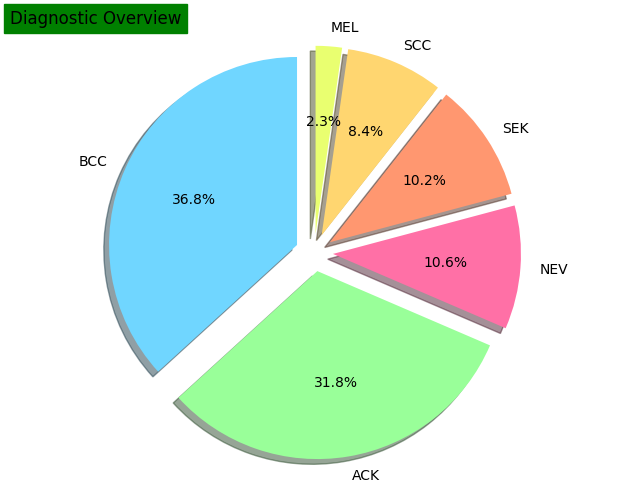

In [8]:
pichart(metadata_skin_cancer,"diagnostic","Diagnostic Overview")

In [9]:
metadata_skin_cancer['img_name'] = metadata_skin_cancer['img_id'].apply(lambda x:x.split('.')[0])
metadata_skin_cancer

,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,...,diagnostic,itch,grew,hurt,changed,bleed,elevation,img_id,biopsed,img_name
0,PAT_1516,1765,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,...,NEV,False,False,False,False,False,False,PAT_1516_1765_530.png,False,PAT_1516_1765_530
1,PAT_46,881,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,...,BCC,True,True,False,True,True,True,PAT_46_881_939.png,True,PAT_46_881_939
2,PAT_1545,1867,NaN,NaN,NaN,NaN,77,NaN,NaN,NaN,...,ACK,True,False,False,False,False,False,PAT_1545_1867_547.png,False,PAT_1545_1867_547
3,PAT_1989,4061,NaN,NaN,NaN,NaN,75,NaN,NaN,NaN,...,ACK,True,False,False,False,False,False,PAT_1989_4061_934.png,False,PAT_1989_4061_934
4,PAT_684,1302,False,True,POMERANIA,POMERANIA,79,False,MALE,True,...,BCC,True,True,False,False,True,True,PAT_684_1302_588.png,True,PAT_684_1302_588
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2293,PAT_1708,3156,NaN,NaN,NaN,NaN,73,NaN,NaN,NaN,...,ACK,True,False,False,False,False,False,PAT_1708_3156_175.png,False,PAT_1708_3156_175
2294,PAT_46,880,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,...,BCC,True,True,False,True,False,False,PAT_46_880_140.png,True,PAT_46_880_140
2295,PAT_1343,1217,NaN,NaN,NaN,NaN,74,NaN,NaN,NaN,...,SEK,False,False,False,False,False,False,PAT_1343_1217_404.png,False,PAT_1343_1217_404
2296,PAT_326,690,False,False,POMERANIA,POMERANIA,58,True,FEMALE,True,...,BCC,True,False,False,False,False,True,PAT_326_690_823.png,True,PAT_326_690_823


In [10]:
#Skin Cancer Type ('Skin Diseases', 'Skin Cancers')
conditions = [
    (metadata_skin_cancer['diagnostic'] == 'NEV') | (metadata_skin_cancer['diagnostic'] == 'SEK') | (metadata_skin_cancer['diagnostic'] == 'ACK'),
    (metadata_skin_cancer['diagnostic'] == 'SCC') | (metadata_skin_cancer['diagnostic'] == 'BCC') | (metadata_skin_cancer['diagnostic'] == 'MEL')]
choices = ['Skin Diseases', 'Skin Cancers']
metadata_skin_cancer['type'] = np.select(conditions, choices, default='blank')
metadata_skin_cancer.head(10)

,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,...,itch,grew,hurt,changed,bleed,elevation,img_id,biopsed,img_name,type
0,PAT_1516,1765,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,...,False,False,False,False,False,False,PAT_1516_1765_530.png,False,PAT_1516_1765_530,Skin Diseases
1,PAT_46,881,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,...,True,True,False,True,True,True,PAT_46_881_939.png,True,PAT_46_881_939,Skin Cancers
2,PAT_1545,1867,NaN,NaN,NaN,NaN,77,NaN,NaN,NaN,...,True,False,False,False,False,False,PAT_1545_1867_547.png,False,PAT_1545_1867_547,Skin Diseases
3,PAT_1989,4061,NaN,NaN,NaN,NaN,75,NaN,NaN,NaN,...,True,False,False,False,False,False,PAT_1989_4061_934.png,False,PAT_1989_4061_934,Skin Diseases
4,PAT_684,1302,False,True,POMERANIA,POMERANIA,79,False,MALE,True,...,True,True,False,False,True,True,PAT_684_1302_588.png,True,PAT_684_1302_588,Skin Cancers
5,PAT_1549,1882,NaN,NaN,NaN,NaN,53,NaN,NaN,NaN,...,True,False,False,False,False,True,PAT_1549_1882_230.png,False,PAT_1549_1882_230,Skin Diseases
6,PAT_778,1471,False,True,GERMANY,ITALY,52,False,FEMALE,False,...,False,True,False,True,True,True,PAT_778_1471_835.png,True,PAT_778_1471_835,Skin Cancers
7,PAT_117,179,False,False,POMERANIA,POMERANIA,74,True,FEMALE,False,...,True,True,True,False,True,True,PAT_117_179_983.png,True,PAT_117_179_983,Skin Cancers
8,PAT_1995,4080,NaN,NaN,NaN,NaN,68,NaN,NaN,NaN,...,True,False,False,True,False,False,PAT_1995_4080_695.png,False,PAT_1995_4080_695,Skin Diseases
9,PAT_705,4015,False,True,GERMANY,GERMANY,58,True,FEMALE,True,...,False,True,False,False,False,False,PAT_705_4015_413.png,False,PAT_705_4015_413,Skin Diseases


In [11]:
conditions = [
    (metadata_skin_cancer['diagnostic'] == 'SCC'),
    (metadata_skin_cancer['diagnostic'] == 'BCC'),
    (metadata_skin_cancer['diagnostic'] == 'MEL'),
    (metadata_skin_cancer['diagnostic'] == 'NEV')|(metadata_skin_cancer['diagnostic'] == 'SEK')|(metadata_skin_cancer['diagnostic'] == 'ACK')]
choices = ['SCC', 'BCC', 'MEL', 'Skin Diseases']
metadata_skin_cancer['U-Net_type'] = np.select(conditions, choices, default='blank')
metadata_skin_cancer.head(10)

,patient_id,lesion_id,smoke,drink,background_father,background_mother,age,pesticide,gender,skin_cancer_history,...,grew,hurt,changed,bleed,elevation,img_id,biopsed,img_name,type,U-Net_type
0,PAT_1516,1765,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,...,False,False,False,False,False,PAT_1516_1765_530.png,False,PAT_1516_1765_530,Skin Diseases,Skin Diseases
1,PAT_46,881,False,False,POMERANIA,POMERANIA,55,False,FEMALE,True,...,True,False,True,True,True,PAT_46_881_939.png,True,PAT_46_881_939,Skin Cancers,BCC
2,PAT_1545,1867,NaN,NaN,NaN,NaN,77,NaN,NaN,NaN,...,False,False,False,False,False,PAT_1545_1867_547.png,False,PAT_1545_1867_547,Skin Diseases,Skin Diseases
3,PAT_1989,4061,NaN,NaN,NaN,NaN,75,NaN,NaN,NaN,...,False,False,False,False,False,PAT_1989_4061_934.png,False,PAT_1989_4061_934,Skin Diseases,Skin Diseases
4,PAT_684,1302,False,True,POMERANIA,POMERANIA,79,False,MALE,True,...,True,False,False,True,True,PAT_684_1302_588.png,True,PAT_684_1302_588,Skin Cancers,BCC
5,PAT_1549,1882,NaN,NaN,NaN,NaN,53,NaN,NaN,NaN,...,False,False,False,False,True,PAT_1549_1882_230.png,False,PAT_1549_1882_230,Skin Diseases,Skin Diseases
6,PAT_778,1471,False,True,GERMANY,ITALY,52,False,FEMALE,False,...,True,False,True,True,True,PAT_778_1471_835.png,True,PAT_778_1471_835,Skin Cancers,BCC
7,PAT_117,179,False,False,POMERANIA,POMERANIA,74,True,FEMALE,False,...,True,True,False,True,True,PAT_117_179_983.png,True,PAT_117_179_983,Skin Cancers,BCC
8,PAT_1995,4080,NaN,NaN,NaN,NaN,68,NaN,NaN,NaN,...,False,False,True,False,False,PAT_1995_4080_695.png,False,PAT_1995_4080_695,Skin Diseases,Skin Diseases
9,PAT_705,4015,False,True,GERMANY,GERMANY,58,True,FEMALE,True,...,True,False,False,False,False,PAT_705_4015_413.png,False,PAT_705_4015_413,Skin Diseases,Skin Diseases


In [41]:
Data_SkinCancer = metadata_skin_cancer[['img_name','img_id','diagnostic','type','U-Net_type']]
Data_SkinCancer

,img_name,img_id,diagnostic,type,U-Net_type
0,PAT_1516_1765_530,PAT_1516_1765_530.png,NEV,Skin Diseases,Skin Diseases
1,PAT_46_881_939,PAT_46_881_939.png,BCC,Skin Cancers,BCC
2,PAT_1545_1867_547,PAT_1545_1867_547.png,ACK,Skin Diseases,Skin Diseases
3,PAT_1989_4061_934,PAT_1989_4061_934.png,ACK,Skin Diseases,Skin Diseases
4,PAT_684_1302_588,PAT_684_1302_588.png,BCC,Skin Cancers,BCC
...,...,...,...,...,...
2293,PAT_1708_3156_175,PAT_1708_3156_175.png,ACK,Skin Diseases,Skin Diseases
2294,PAT_46_880_140,PAT_46_880_140.png,BCC,Skin Cancers,BCC
2295,PAT_1343_1217_404,PAT_1343_1217_404.png,SEK,Skin Diseases,Skin Diseases
2296,PAT_326_690_823,PAT_326_690_823.png,BCC,Skin Cancers,BCC


In [48]:
Data_SkinCancer.to_csv('./Data_SkinCancer.csv', index=False)

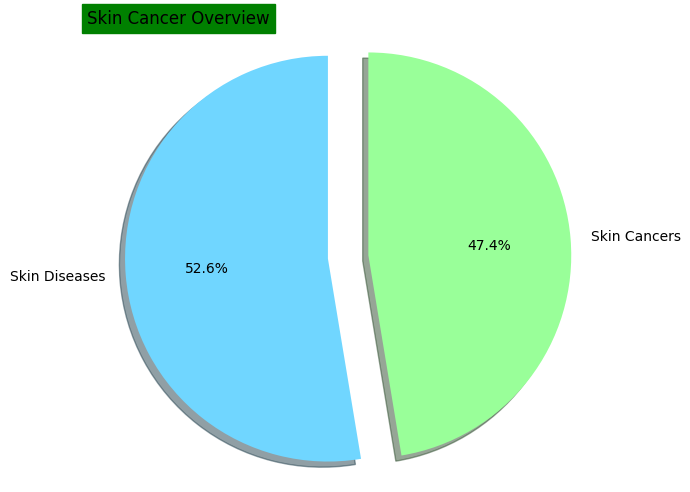

In [13]:
pichart(Data_SkinCancer,"type","Skin Cancer Overview")

In [14]:
# Split Data (Skin Diseases = 1000 , Skin Cancers = 1000) Other to Test Data 178 images
skin_cancer_Train = pd.DataFrame()
skin_cancer_Test = pd.DataFrame()

Skin_Diseases = 0
Skin_Cancers = 0
for index, row in tqdm(Data_SkinCancer.iterrows()):
    temporary =  pd.DataFrame({'img_id':row['img_id'], 'diagnostic':row['diagnostic'], 'type':row['type']}, index=[0])
    if row['type'] == "Skin Diseases" and Skin_Diseases < 1000 :
        skin_cancer_Train = pd.concat([skin_cancer_Train, temporary],ignore_index=True)
        Skin_Diseases = Skin_Diseases + 1
    elif row['type'] == "Skin Cancers" and Skin_Cancers < 1000 :
        skin_cancer_Train = pd.concat([skin_cancer_Train, temporary],ignore_index=True)
        Skin_Cancers = Skin_Cancers + 1
    else :
        if row['type'] == "Skin Diseases" and Skin_Diseases < 1089 :
            skin_cancer_Test = pd.concat([skin_cancer_Test, temporary],ignore_index=True)
            Skin_Diseases = Skin_Diseases + 1
        elif row['type'] == "Skin Cancers" and Skin_Cancers < 1089 :
            skin_cancer_Test = pd.concat([skin_cancer_Test, temporary],ignore_index=True)
            Skin_Cancers = Skin_Cancers + 1

skin_cancer = pd.concat([skin_cancer_Train, skin_cancer_Test], ignore_index=True)

2298it [00:01, 1368.93it/s]


In [23]:
skin_cancer_Test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   img_id      178 non-null    object
 1   diagnostic  178 non-null    object
 2   type        178 non-null    object
dtypes: object(3)
memory usage: 4.3+ KB


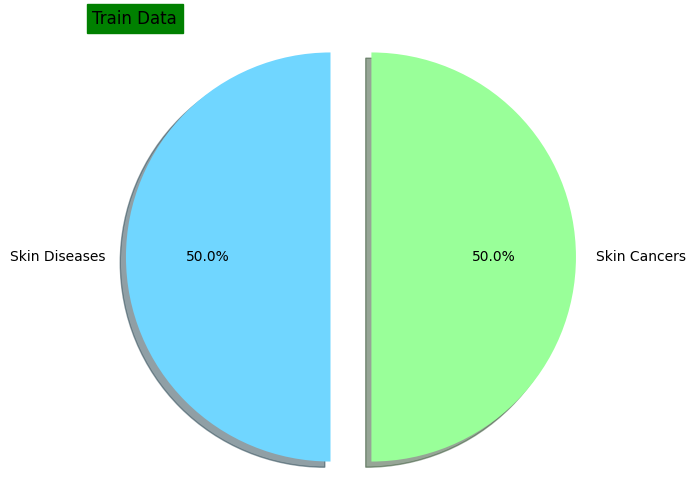

In [15]:
pichart(skin_cancer_Train,"type","Train Data")

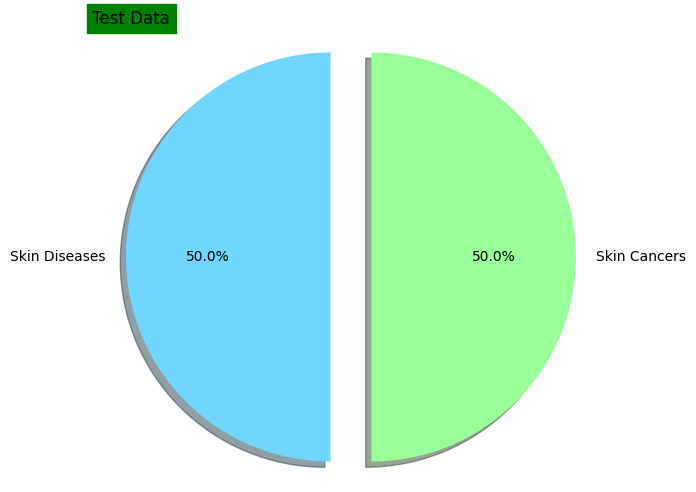

In [16]:
pichart(skin_cancer_Test,"type","Test Data")

In [17]:
# Dullrazor algorithm: https://github.com/sunnyshah2894/DigitalHairRemoval
def dullrazor(img):
     # -*- coding: utf-8 -*-
     """
     Following are the DHR tasks followed in this example code:
     
     -- Applying Morphological Black-Hat transformation
     -- Creating the mask for InPainting task
     -- Applying inpainting algorithm on the image
     """

     src = cv2.imread(img)

     # Convert the original image to grayscale
     grayScale = cv2.cvtColor( src, cv2.COLOR_RGB2GRAY )

     # Kernel for the morphological filtering
     kernel = cv2.getStructuringElement(1,(17,17))

     # Perform the blackHat filtering on the grayscale image to find the 
     # hair countours
     blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)

     # intensify the hair countours in preparation for the inpainting 
     # algorithm
     ret,thresh2 = cv2.threshold(blackhat,10,255,cv2.THRESH_BINARY)

     # inpaint the original image depending on the mask
     dst = cv2.inpaint(src,thresh2,1,cv2.INPAINT_TELEA)
    
     return dst

In [18]:
# combine images to folder (first time)
if len(os.listdir(Directory)) < 2298:
    for i in os.listdir(old_Directory):
        img_ID = os.listdir(old_Directory + '/' + i)
        all_img = list(map(lambda x: old_Directory + '/' + i + '/' + x , img_ID))
        for j in tqdm(all_img):
            ID = os.path.split(j)
            Dullrazor = dullrazor(j) # Dullrazor algorithm
            cv2.imwrite(str(Directory + ID[1]),Dullrazor)

In [19]:
# Thresholding 
if len(os.listdir(Directory)) < 2298:
    for index, row in tqdm(Data_SkinCancer.iterrows()):
        image = cv2.imread(Directory+row['img_id'], cv2.IMREAD_COLOR)
        img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        canny_settings = [50, 100]
        edged = cv2.Canny(img, canny_settings[0], canny_settings[1])
        ret, thresh1 = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY_INV)
        contours, hierarchy = cv2.findContours(thresh1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        width,height = 224,224
        #finding contours
        h, w = img.shape[:2]

        idx = 0
        for c in contours:
            x, y, w, h = cv2.boundingRect(c)
            if w > 50 and h > 50:
                idx += 1
                new_img = image[y:y + h, x:x + w]
                #cropping images
                dim = (width, height)
                resized = cv2.resize(new_img, dim, interpolation=cv2.INTER_AREA)
        cv2.imwrite(Threshold+row['img_id'], resized)
        

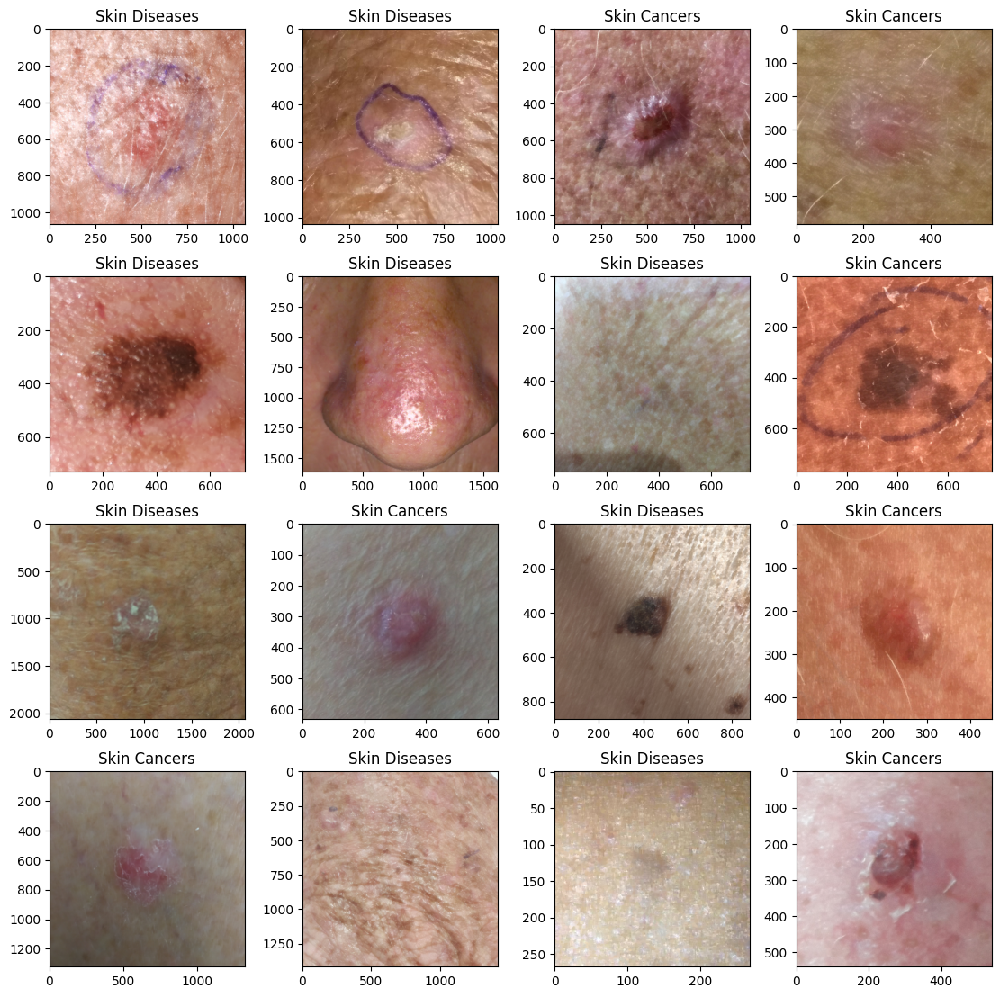

In [20]:
files_path_ex = skin_cancer_Train.sample(n=16).reset_index(drop=True)

#visualize
plt.figure(figsize = (11,11),constrained_layout=True)
for index, row in files_path_ex.iterrows():
    plt.subplot(4, 4, index+1)
    plt.imshow(load_img(Directory+row['img_id']))
    plt.title(row['type'])

In [21]:
# Splitting training(1600) and validating(400) data
train_df, validate_df = train_test_split(skin_cancer_Train, test_size=0.2, random_state=42)

#  reset the old index 
train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)

In [22]:
# Set a datagenerator
# Data generator apply different effect to the training images
train_datagen = ImageDataGenerator(rotation_range=20,       #หมุนภาพ (Rotate) ไม่เกินองศา แบบสุ่ม
                                    rescale=1./255,         #ปรับขนาดภาพให้เป็นระดับสีของภาพเท่ากับ 255
                                    shear_range=0.1,        #บิดภาพ (Shear) แบบสุ่ม
                                    zoom_range=0.1,         #ขยายภาพ (Zoom) แบบสุ่ม
                                    horizontal_flip=True,   #กลับภาพแนวนอน (Horizontal Flip) แบบสุ่ม
                                    vertical_flip=True,     #กลับภาพแนวตั้ง (Vertical Flip) แบบสุ่ม
                                    width_shift_range=0.1,  #การเลื่อนภาพซ้ายขวาแบบสุ่ม
                                    height_shift_range=0.1) #การเลื่อนภาพขึ้นลงแบบสุ่ม

# Generate data for training and validation
train_generator = train_datagen.flow_from_dataframe(train_df, 
                                                    Directory, 
                                                    x_col='img_id', 
                                                    y_col='type',
                                                    target_size=(224,224),
                                                    class_mode='categorical',
                                                    batch_size=16)
validate_generator = train_datagen.flow_from_dataframe(validate_df,
                                                       Directory,
                                                       x_col='img_id',
                                                       y_col='type',
                                                       target_size=(224,224),
                                                       class_mode='categorical',
                                                       batch_size=16)
#test set
test_generator = ImageDataGenerator()
test_generator = test_generator.flow_from_dataframe(skin_cancer_Test,
                                             Directory,
                                             x_col='img_id',
                                             y_col='type',
                                             target_size=(224, 224),
                                             class_mode='categorical',
                                             shuffle=True)
#================
# Uncomment this block if want to see a sample of data generator
example = train_df.sample(n=1).reset_index(drop=True)
example_gen = train_datagen.flow_from_dataframe(example,
                                                Directory,
                                                x_col = 'img_id',
                                                y_col = 'type',
                                                target_size=(224,224),
                                                class_mode='categorical')

Found 1600 validated image filenames belonging to 2 classes.
Found 400 validated image filenames belonging to 2 classes.
Found 178 validated image filenames belonging to 2 classes.
Found 1 validated image filenames belonging to 1 classes.


In [23]:
classes = list(iter(train_generator.class_indices))
class_indices = train_generator.class_indices
print(class_indices)

{'Skin Cancers': 0, 'Skin Diseases': 1}


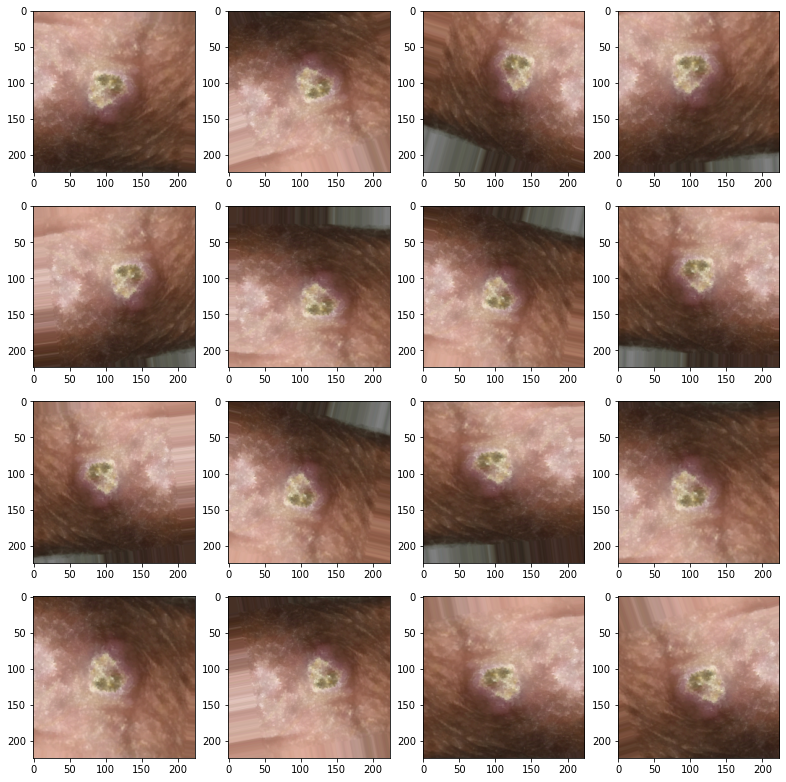

In [24]:
plt.figure(figsize=(11,11))
for i in range(0, 16):
    plt.subplot(4,4,i+1)
    for X, Y in example_gen:
        image = X[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

## Transfer Learning & Fine-Tuning

In [25]:
# Create a model, and removing the last layer that is classifying 1000 images. This will be replaced with images classes we have. 
#Training with Imagenet weights
base_model = DenseNet121(input_shape=(224,224,3),
                    weights= 'imagenet',
                    include_top=False,
                    pooling='max',
                    )
# freeze layer
base_model.trainable = False

layer = Flatten()(base_model.output)
layer = Dropout(0.2)(layer)
prediction = Dense(len(classes), activation='softmax')(layer)

#Creating model object 
model = Model(inputs=base_model.input, outputs=prediction)

# Fine-tune from this layer onwards
len_layers = len(model.layers)
freeze = len_layers*0.20

# This sets the base that the layers are not trainable. If we'd want to train the layers with custom data, these two lines can be ommitted. 
for layer in model.layers[int(freeze):]:
  layer.trainable = True

2022-11-27 23:03:45.872203: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-11-27 23:03:45.872225: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [26]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ",len(model.layers))

Number of layers in the base model:  431


In [27]:
model.summary()
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics = ['accuracy'])

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                              

In [28]:
# datetime for filename saving
dt_now = str(datetime.datetime.now()).replace(".", "_").replace(":", "_")
filepath = Checkpoint + '/weights-{epoch:02d}-{val_accuracy:.2f}.hdf5'

#define checkpoint
checkpoint = ModelCheckpoint(filepath, 
                             monitor='val_accuracy',
                             save_best_only=True,
                             mode="max",
                             verbose=1)

#early stopping
earlystop = EarlyStopping(monitor='val_loss',
                          patience=3,
                          mode='auto',
                          verbose=1)

#reduce learning rate
reduce_lr = ReduceLROnPlateau(monitor = 'accuracy', 
                              factor = 0.3, 
                              patience = 2, 
                              min_delta = 0.001,
                              mode='auto',
                              verbose=1)

In [29]:
#Step 3: Initialize Tensorboard to monitor changes in Model Loss 
import datetime
%load_ext tensorboard
log_dir = "logs/fit/"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [30]:
#Visualize on tensorboard (move this above)
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6007 (pid 64567), started 11:15:24 ago. (Use '!kill 64567' to kill it.)

In [31]:
#train model
history = model.fit(train_generator,
                    epochs = 100,
                    validation_data=validate_generator,
                    callbacks=[checkpoint,reduce_lr,tensorboard_callback]
                    )


2022-11-27 23:03:48.142783: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


Epoch 1/100


2022-11-27 23:03:50.779776: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


100/100 [==============================] - ETA: 0s - loss: 1.6579 - accuracy: 0.6469

2022-11-27 23:04:43.976100: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.



Epoch 00001: val_accuracy improved from -inf to 0.69250, saving model to ./Checkpoint/weights-01-0.69.hdf5
100/100 [==============================] - 72s 639ms/step - loss: 1.6579 - accuracy: 0.6469 - val_loss: 0.8820 - val_accuracy: 0.6925 - lr: 1.0000e-04
Epoch 2/100
100/100 [==============================] - ETA: 0s - loss: 1.0340 - accuracy: 0.7412
Epoch 00002: val_accuracy improved from 0.69250 to 0.73500, saving model to ./Checkpoint/weights-02-0.73.hdf5
100/100 [==============================] - 61s 612ms/step - loss: 1.0340 - accuracy: 0.7412 - val_loss: 0.9142 - val_accuracy: 0.7350 - lr: 1.0000e-04
Epoch 3/100
100/100 [==============================] - ETA: 0s - loss: 0.8641 - accuracy: 0.7575
Epoch 00003: val_accuracy improved from 0.73500 to 0.78500, saving model to ./Checkpoint/weights-03-0.78.hdf5
100/100 [==============================] - 62s 612ms/step - loss: 0.8641 - accuracy: 0.7575 - val_loss: 0.8952 - val_accuracy: 0.7850 - lr: 1.0000e-04
Epoch 4/100
100/100 [====

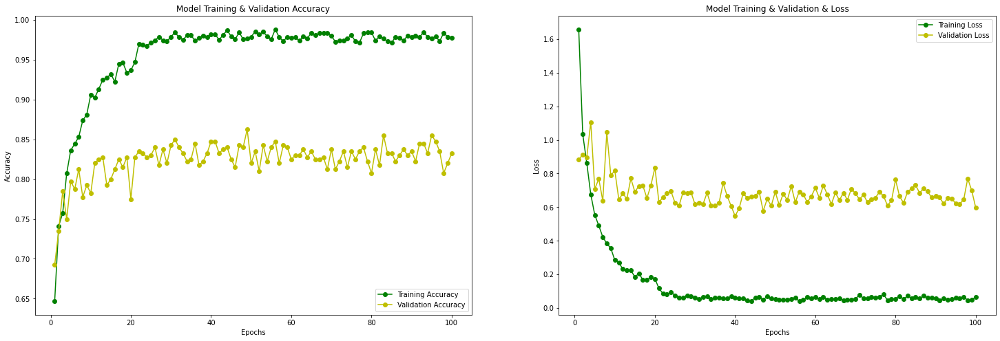

In [32]:
fig , ax = plt.subplots(1,2)
fig.set_size_inches(25,8)

train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

ax[0].plot(epochs , train_acc , 'g-o' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'y-o' , label = 'Validation Accuracy')
ax[0].set_title('Model Training & Validation Accuracy')
ax[0].legend(loc = 'lower right')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'y-o' , label = 'Validation Loss')
ax[1].set_title('Model Training & Validation & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

## Evaluation and prediction

In [33]:
val_loss, val_accuracy = model.evaluate(validate_generator)
print("Validate accuracy: {:.2f}%".format(val_accuracy * 100))
print("Validate loss: {:.2f}%".format(val_loss * 100))

25/25 [==============================] - 11s 439ms/step - loss: 0.6492 - accuracy: 0.8375
Validate accuracy: 83.75%
Validate loss: 64.92%


In [34]:
test_loss, test_accuracy = model.evaluate(test_generator)
print("Test accuracy: {:.2f}%".format(test_accuracy * 100))
print("Test loss: {:.2f}%".format(test_loss * 100))

6/6 [==============================] - 6s 863ms/step - loss: 4.6701 - accuracy: 0.5169
Test accuracy: 51.69%
Test loss: 467.01%


In [35]:
# define labels for testing
labels = test_generator.classes
labels =[list(class_indices.keys())[list(class_indices.values()).index(x)] for x in labels]
# make prediction
prediction_test = np.argmax(model.predict(test_generator), axis=1)
prediction_test =[list(class_indices.keys())[list(class_indices.values()).index(x)] for x in prediction_test]

2022-11-28 00:43:27.942700: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


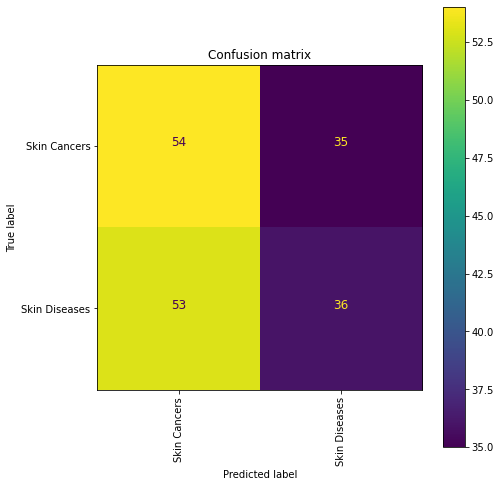

In [36]:
def plot_confusion_matrix(cm, classes,
                          normalize = False,
                          title = 'Confusion matrix',
                          cmap = "viridis"):
    
    plt.figure(figsize = (7,7))
    im_ = plt.imshow(cm, interpolation = 'nearest', cmap = cmap)
    plt.title(title)
    plt.colorbar()
    plt.grid(False)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation = 90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]

    thresh = (cm.max() + cm.min()) / 2.0
    cmap_min, cmap_max = im_.cmap(0), im_.cmap(1.0)
    cm = np.round(cm,2)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 fontsize = 12,
                 horizontalalignment = "center",
                 color = cmap_max if cm[i, j] < thresh else cmap_min)

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

#get confusion matrix
cm = confusion_matrix(labels, prediction_test)

#plot
plot_confusion_matrix(cm, classes, normalize=False)

In [37]:
#get classification report
print(classification_report(labels, prediction_test))

               precision    recall  f1-score   support

 Skin Cancers       0.50      0.61      0.55        89
Skin Diseases       0.51      0.40      0.45        89

     accuracy                           0.51       178
    macro avg       0.51      0.51      0.50       178
 weighted avg       0.51      0.51      0.50       178



In [38]:
prediction = []
original = []
image = []
expand_dims = []
for index, row in tqdm(skin_cancer_Test.iterrows()): 
  #open the image
  img= load_img(Directory+row['img_id'],target_size=(224,224))
  #append to image list
  image.append(img)
  #expand dimension
  img = np.expand_dims(img, axis=0)
  expand_dims.append(img)
  #predict & get the index corresponding to the highest value in the prediction
  predict =  np.argmax(model.predict(img))
  #append the predicted class to the list
  prediction.append(list(class_indices.keys())[list(class_indices.values()).index(predict)])
  #append original class to the list
  original.append(row['type'])
  

0it [00:00, ?it/s]2022-11-28 00:43:34.267960: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
178it [00:15, 11.49it/s]


##  Visualize GradCAM

In [73]:
#used the VizGradCam code from gkeechin.py VizGradCam is the fastest way to visualize GradCAM in Keras models.
#https://github.com/gkeechin/vizgradcam/blob/main/gradcam.py

import cv2
import numpy as np
from PIL import Image
import tensorflow as tf
import tensorflow.keras as K
import matplotlib.pyplot as plt
from skimage.transform import resize
from tensorflow.keras.models import Model

def VizGradCAM(model, image, interpolant=0.7, plot_results=True):
    """VizGradCAM - Displays GradCAM based on Keras / TensorFlow models
    using the gradients from the last convolutional layer. This function
    should work with all Keras Application listed here:
    https://keras.io/api/applications/
    Parameters:
    model (keras.model): Compiled Model with Weights Loaded
    image: Image to Perform Inference On
    plot_results (boolean): True - Function Plots using PLT
                            False - Returns Heatmap Array
    Returns:
    Heatmap Array?
    """
    # Sanity Check
    assert (
        interpolant > 0 and interpolant < 1
    ), "Heatmap Interpolation Must Be Between 0 - 1"

    last_conv_layer = next(
        x for x in model.layers[::-1] if isinstance(x, K.layers.Conv2D)
    )
    target_layer = model.get_layer(last_conv_layer.name)

    original_img = image
    img = np.expand_dims(original_img, axis=0)
    prediction = model.predict(img)

    # Obtain Prediction Index
    prediction_idx = np.argmax(prediction)

    # Compute Gradient of Top Predicted Class
    with tf.GradientTape() as tape:
        gradient_model = Model([model.inputs], [target_layer.output, model.output])
        conv2d_out, prediction = gradient_model(img)
        # Obtain the Prediction Loss
        loss = prediction[:, prediction_idx]

    # Gradient() computes the gradient using operations recorded
    # in context of this tape
    gradients = tape.gradient(loss, conv2d_out)

    # Obtain the Output from Shape [1 x H x W x CHANNEL] -> [H x W x CHANNEL]
    output = conv2d_out[0]

    # Obtain Depthwise Mean
    weights = tf.reduce_mean(gradients[0], axis=(0, 1))

    # Create a 7x7 Map for Aggregation
    activation_map = np.zeros(output.shape[0:2], dtype=np.float32)

    # Multiply Weights with Every Layer
    for idx, weight in enumerate(weights):
        activation_map += weight * output[:, :, idx]

    # Resize to Size of Image
    activation_map = cv2.resize(
        activation_map.numpy(), (original_img.shape[1], original_img.shape[0])
    )

    # Ensure No Negative Numbers
    activation_map = np.maximum(activation_map, 0)

    # Convert Class Activation Map to 0 - 255
    activation_map = (activation_map - activation_map.min()) / (
        activation_map.max() - activation_map.min()
    )
    activation_map = np.uint8(255 * activation_map)

    # Convert to Heatmap
    heatmap = cv2.applyColorMap(activation_map, cv2.COLORMAP_JET)

    # Superimpose Heatmap on Image Data
    original_img = np.uint8(
        (original_img - original_img.min())
        / (original_img.max() - original_img.min())
        * 255
    )

    cvt_heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    # Enlarge Plot
    plt.rcParams["figure.dpi"] = 100

    if plot_results == True:
        plt.imshow(
            np.uint8(original_img * interpolant + cvt_heatmap * (1 - interpolant))
        )
    else:
        return cvt_heatmap

In [41]:
# Predict Class
def Classify(image_array,show=True):
    img = np.expand_dims(image_array, axis=0)
    img = np.vstack([img])
    pred = model.predict(img)
    score = tf.nn.softmax(pred[0])
    if show == True:
        print(
        "This image most likely belongs to {} with a {:.2f} percent confidence."
        .format(classes[np.argmax(score)], 100 * np.max(score)))
        
    pred_class = classes[np.argmax(pred)]
    
    return pred_class

Dimensions :  <PIL.Image.Image image mode=RGB size=224x224 at 0x578119070>


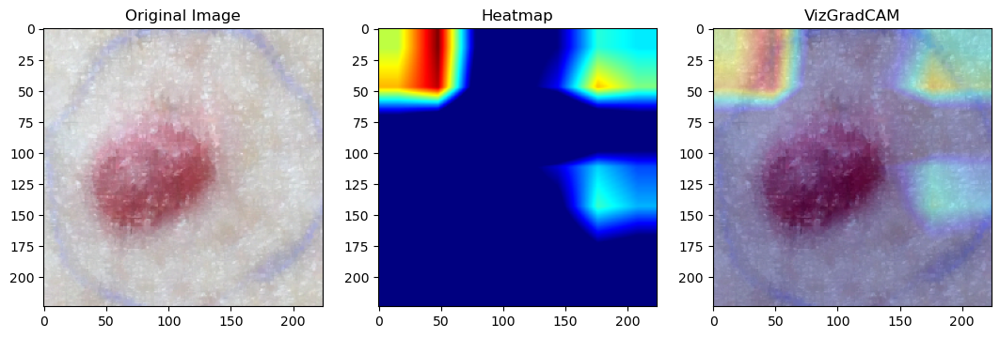

In [74]:
#load image
test_img = load_img("./New_PAD-UFES-20/PAT_633_1199_218.png", target_size=(224, 224))
print('Dimensions : ',test_img)

fig , ax = plt.subplots(1,3)
fig.set_size_inches(13,13)

ax[0].set_title('Original Image')
ax[0].imshow(test_img)
ax[1].set_title('Heatmap')
ax[1].imshow(VizGradCAM(model, img_to_array(test_img), plot_results=False))
ax[2].set_title('VizGradCAM')
ax[2] = VizGradCAM(model, img_to_array(test_img), plot_results=True)

3it [00:06,  2.00s/it]


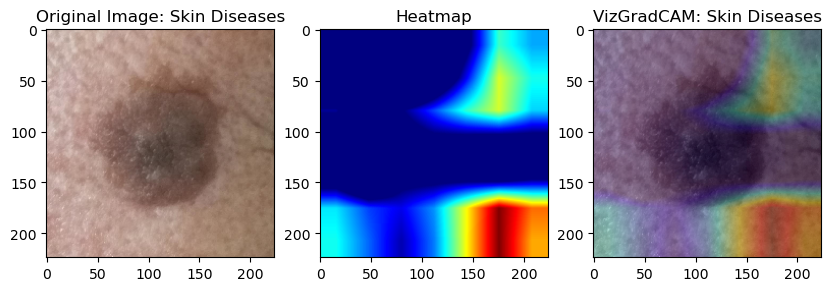

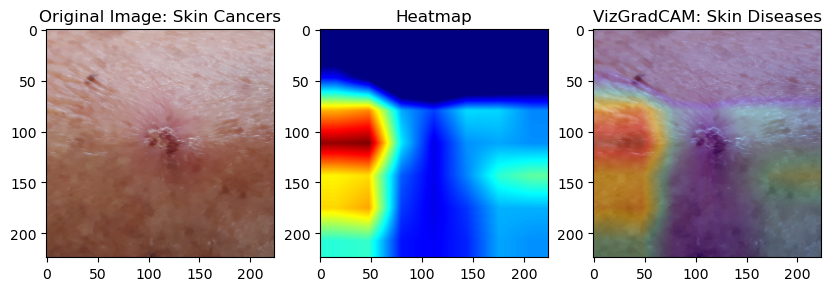

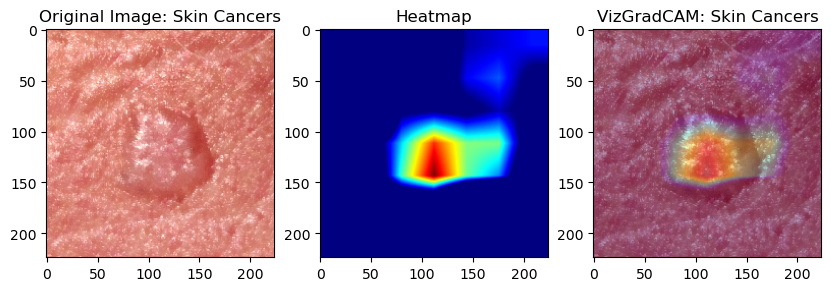

In [75]:
files_path_test = skin_cancer_Test.sample(n=3).reset_index(drop=True)

#visualize
for index, row in tqdm(files_path_test.iterrows()):
    img = load_img(Directory+row['img_id'],target_size=(224, 224))
    fig , ax = plt.subplots(1,3)
    fig.set_size_inches(10,10)
    ax[0].set_title('Original Image: '+row['type'])
    ax[0].imshow(img)
    ax[1].set_title('Heatmap')
    ax[1].imshow(VizGradCAM(model, img_to_array(img), plot_results=False))
    ax[2].set_title('VizGradCAM: '+ Classify(img,show=False))
    ax[2] = VizGradCAM(model, img_to_array(img), plot_results=True)

8it [00:07,  1.04it/s]


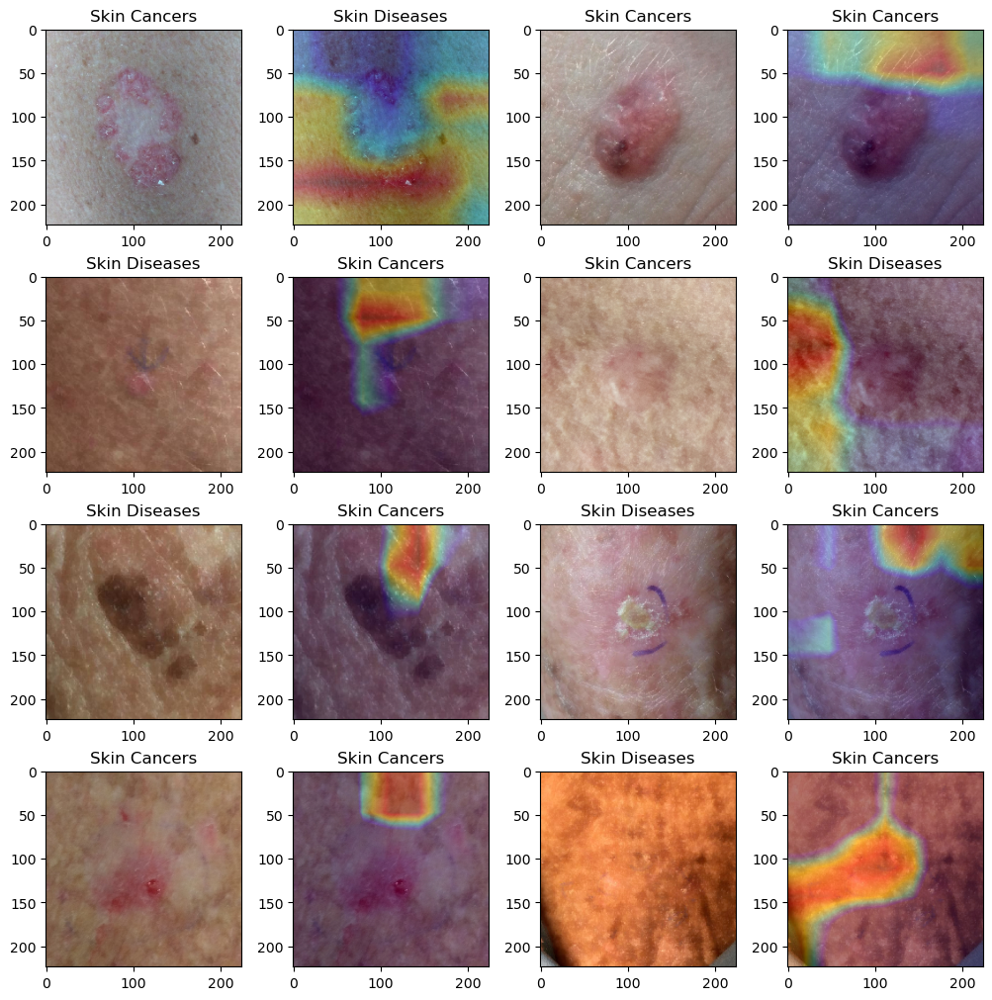

In [44]:
files_path_test = skin_cancer_Test.sample(n=8).reset_index(drop=True)

#visualize
plt.figure(figsize = (10,10),constrained_layout=True)
i = 1
for index, row in tqdm(files_path_test.iterrows()):
    plt.subplot(4, 4, i)
    plt.imshow(load_img(Directory+row['img_id'],target_size=(224, 224)))
    plt.title(row['type'])
    i += 1
    plt.subplot(4, 4, i)
    img_ar = img_to_array(load_img(Directory+row['img_id'],target_size=(224, 224)))
    VizGradCAM(model, img_ar, plot_results=True)
    plt.title(Classify(img_ar,show=False))
    i += 1

## [U-Net Architecture](https://towardsdatascience.com/semantic-segmentation-of-aerial-imagery-using-u-net-in-python-552705238514)

In [26]:
import sys
np.set_printoptions(threshold=sys.maxsize)

In [27]:
# get a list of filenames(without extension) in directory
files_no_ext_Directory = [i.split('.')[0] for i in os.listdir(Directory)]
files_no_ext_Target = [i.split('.')[0] for i in os.listdir(Target)]
symmetric = set(files_no_ext_Directory).symmetric_difference(set(files_no_ext_Target))
if symmetric == set():
    print("Symmetric files: "+str(len(files_no_ext_Directory)))
else:
    print("Asymmetric File: "+ str(symmetric))
    
# number of classes in segmentation dataset
n_classes = len(Data_SkinCancer['U-Net_type'].unique().tolist())

Symmetric files: 2298


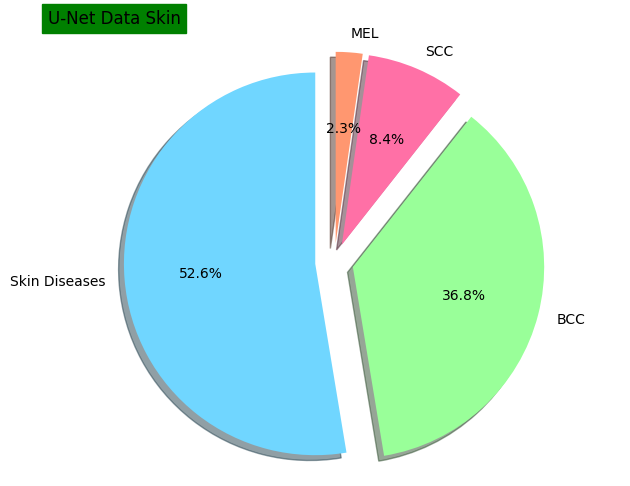

In [28]:
pichart(Data_SkinCancer,"U-Net_type","U-Net Data Skin")

In [29]:
count_values_in_column(Data_SkinCancer,"U-Net_type")

,Total,Percentage
Skin Diseases,1209,52.61
BCC,845,36.77
SCC,192,8.36
MEL,52,2.26


In [36]:
skin_cancer_unet_test_SkinDiseases = Data_SkinCancer[Data_SkinCancer['U-Net_type'] =='Skin Diseases'].sample(n = 1,random_state = 42,ignore_index = True)
skin_cancer_unet_test_BCC = Data_SkinCancer[Data_SkinCancer['U-Net_type'] =='BCC'].sample(n = 1,random_state = 42,ignore_index = True)
skin_cancer_unet_test_SCC = Data_SkinCancer[Data_SkinCancer['U-Net_type'] =='SCC'].sample(n = 1,random_state = 42,ignore_index = True)
skin_cancer_unet_test_MEL = Data_SkinCancer[Data_SkinCancer['U-Net_type'] =='MEL'].sample(n = 1,random_state = 42,ignore_index = True)
skin_cancer_unet_test = pd.concat([skin_cancer_unet_test_SkinDiseases, skin_cancer_unet_test_BCC, skin_cancer_unet_test_SCC, skin_cancer_unet_test_MEL], ignore_index=True)
skin_cancer_unet_test

,img_name,img_id,diagnostic,type,U-Net_type
0,PAT_1089_375_677,PAT_1089_375_677.png,NEV,Skin Diseases,Skin Diseases
1,PAT_896_1705_582,PAT_896_1705_582.png,BCC,Skin Cancers,BCC
2,PAT_319_680_166,PAT_319_680_166.png,SCC,Skin Cancers,SCC
3,PAT_717_1347_899,PAT_717_1347_899.png,MEL,Skin Cancers,MEL


In [37]:
skin_cancer_unet = Data_SkinCancer.drop(Data_SkinCancer[Data_SkinCancer['U-Net_type'] =='Skin Diseases'].sample(n = 295,random_state = 42).index)
skin_cancer_unet = skin_cancer_unet.drop(skin_cancer_unet[skin_cancer_unet['U-Net_type'] =='BCC'].sample(n = 1,random_state = 42).index)
skin_cancer_unet = skin_cancer_unet.drop(skin_cancer_unet[skin_cancer_unet['U-Net_type'] =='SCC'].sample(n = 1,random_state = 42).index)
skin_cancer_unet = skin_cancer_unet.drop(skin_cancer_unet[skin_cancer_unet['U-Net_type'] =='MEL'].sample(n = 1,random_state = 42).index)

skin_cancer_unet.reset_index(drop=True)

,img_name,img_id,diagnostic,type,U-Net_type
0,PAT_1516_1765_530,PAT_1516_1765_530.png,NEV,Skin Diseases,Skin Diseases
1,PAT_46_881_939,PAT_46_881_939.png,BCC,Skin Cancers,BCC
2,PAT_1545_1867_547,PAT_1545_1867_547.png,ACK,Skin Diseases,Skin Diseases
3,PAT_1989_4061_934,PAT_1989_4061_934.png,ACK,Skin Diseases,Skin Diseases
4,PAT_684_1302_588,PAT_684_1302_588.png,BCC,Skin Cancers,BCC
...,...,...,...,...,...
1995,PAT_1708_3156_175,PAT_1708_3156_175.png,ACK,Skin Diseases,Skin Diseases
1996,PAT_46_880_140,PAT_46_880_140.png,BCC,Skin Cancers,BCC
1997,PAT_1343_1217_404,PAT_1343_1217_404.png,SEK,Skin Diseases,Skin Diseases
1998,PAT_326_690_823,PAT_326_690_823.png,BCC,Skin Cancers,BCC


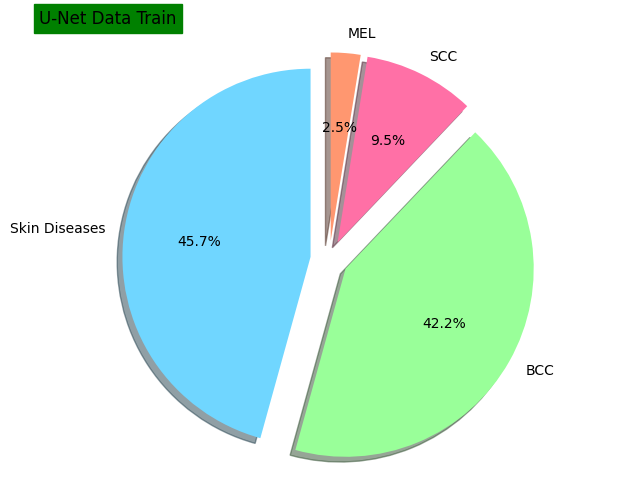

In [38]:
pichart(skin_cancer_unet,"U-Net_type","U-Net Data Train")

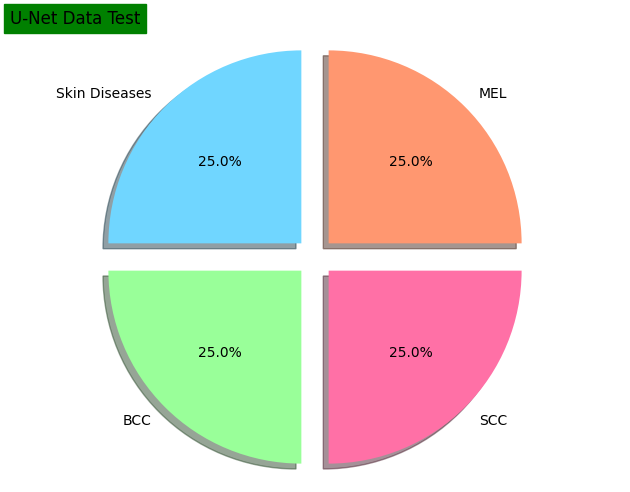

In [39]:
pichart(skin_cancer_unet_test,"U-Net_type","U-Net Data Test")

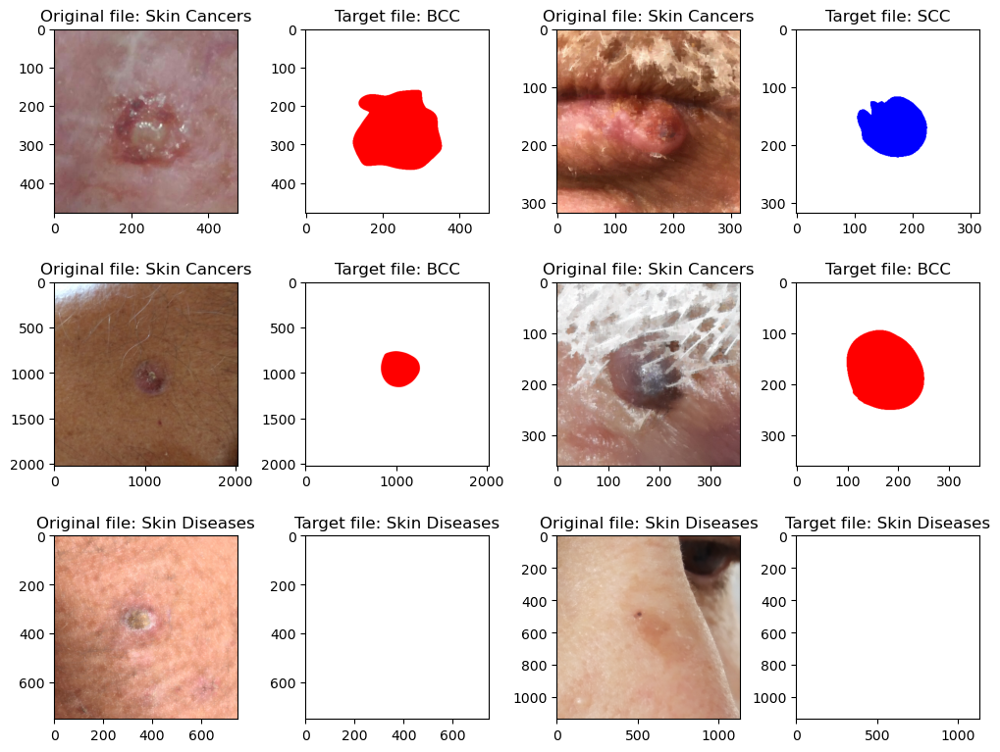

In [52]:
files_path_ex = skin_cancer_unet.sample(n=6).reset_index(drop=True)

# Display Input Images and Target Labels
plt.figure(figsize = (10,10),constrained_layout=True)
i = 1
for index, row in files_path_ex.iterrows():
    plt.subplot(4, 4, i)
    plt.imshow(load_img(Directory+row['img_id']))
    plt.title("Original file: "+row['type'])
    i += 1
    plt.subplot(4, 4, i)
    plt.imshow(load_img(Target+row['img_name']+'.tiff'))
    plt.title("Target file: "+row['U-Net_type'])
    i += 1

In [53]:
#presents each class name, corresponding hex colour code, and converted RBG values.
class MaskColorMap(Enum):
    SCC = (0, 128 ,0)
    BCC = (255, 0, 0)
    MEL = (0, 0, 255)
    Diseases = (255, 255, 255)

U_net_class = ['SCC', 'BCC', 'MEL', 'Diseases']
hex_colour_code = ['008000', 'FF0000', '0000FF','FFFFFF']
rgb_colour_code = ['(0,128,0)', '(255,0,0)', '(0,0,255)','(255,255,255)']
class_colour = pd.DataFrame(list(zip(U_net_class, hex_colour_code,rgb_colour_code)),
               columns =['Class', 'Hex #', 'RGB'])
class_colour.head()

,Class,Hex #,RGB
0,SCC,008000,"(0,128,0)"
1,BCC,FF0000,"(255,0,0)"
2,MEL,0000FF,"(0,0,255)"
3,Diseases,FFFFFF,"(255,255,255)"


In [54]:
def load_images_and_patchify(img_path, patch_size):
    """
    :param patch_size: image patchify square size
    :param directory_path: path to root directory containing training and test images
    :return: list of images from directory
    """
    # initialize empty list for images
    instances = []
    # Reads image 
    image = img_to_array(load_img(img_path,target_size=(patch_size,patch_size)),dtype=np.uint8)

    # Extract patches from each image, step=patch_size means no overlap
    patch_img = patchify(image, (patch_size, patch_size, 3), step=patch_size)
    
    # iterate over vertical patch axis
    for j in range(patch_img.shape[0]):
        # iterate over horizontal patch axis
        for k in range(patch_img.shape[1]):
            # patches are located like a grid. use (j, k) indices to extract single patched image
            single_patch_img = patch_img[j, k]
            # Drop extra extra dimension from patchify
            instances.append(np.squeeze(single_patch_img))

    return instances

In [55]:
def get_training_data(Dataframe, directory_path, directory_target, patch_size):
    # initialise lists
    image_dataset, mask_dataset = [], []

    # walk through root directory
    for index, row in tqdm(Dataframe.iterrows()):
        image_dataset.extend(load_images_and_patchify(directory_path+row['img_id'], patch_size=patch_size))
        mask_dataset.extend(load_images_and_patchify(directory_target+row['img_name']+'.tiff', patch_size=patch_size))

    # return input images and masks
    return np.array(image_dataset), np.array(mask_dataset)


In [56]:
def display_images(instances, rows=2, titles=None):
    """
    :param instances:  list of images
    :param rows: number of rows in subplot
    :param titles: subplot titles
    :return:
    """
    n = len(instances)
    cols = n // rows if (n / rows) % rows == 0 else (n // rows) + 1
    # Display Input Images and Target Labels
    plt.figure(figsize = (10,10),constrained_layout=True)
    for j, image in enumerate(instances):
        plt.subplot(4, 4, j + 1)
        plt.title('') if titles is None else plt.title(titles[j])
        plt.imshow(image)    

In [57]:
def one_hot_encode_masks(masks, num_classes):
    """
    :param masks: Y_train patched mask dataset
    :param num_classes: number of classes
    :return:
    """
    # initialise list for integer encoded masks
    integer_encoded_labels = []

    # iterate over each mask
    for mask in tqdm(masks):

        # get image shape
        _img_height, _img_width, _img_channels = mask.shape

        # create new mask of zeros
        encoded_image = np.zeros((_img_height, _img_width, 1)).astype(int)

        for j, cls in enumerate(MaskColorMap):
            encoded_image[np.all(mask == cls.value, axis=-1)] = j

        # append encoded image
        integer_encoded_labels.append(encoded_image)

    # return one-hot encoded labels
    return to_categorical(y=integer_encoded_labels, num_classes=num_classes)

In [58]:
# jaccard similarity: the size of the intersection divided by the size of the union of two sets
from keras import backend as K
def jaccard_index(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)

In [59]:
# create (X, Y) training data
X, Y = get_training_data(Dataframe = skin_cancer_unet, directory_path = Directory,directory_target = Target,patch_size = 224)
# extract X_train shape parameters
m, img_height, img_width, img_channels = X.shape
print('Number of patched image training data:', m)

2000it [00:53, 37.14it/s]


Number of patched image training data: 2000


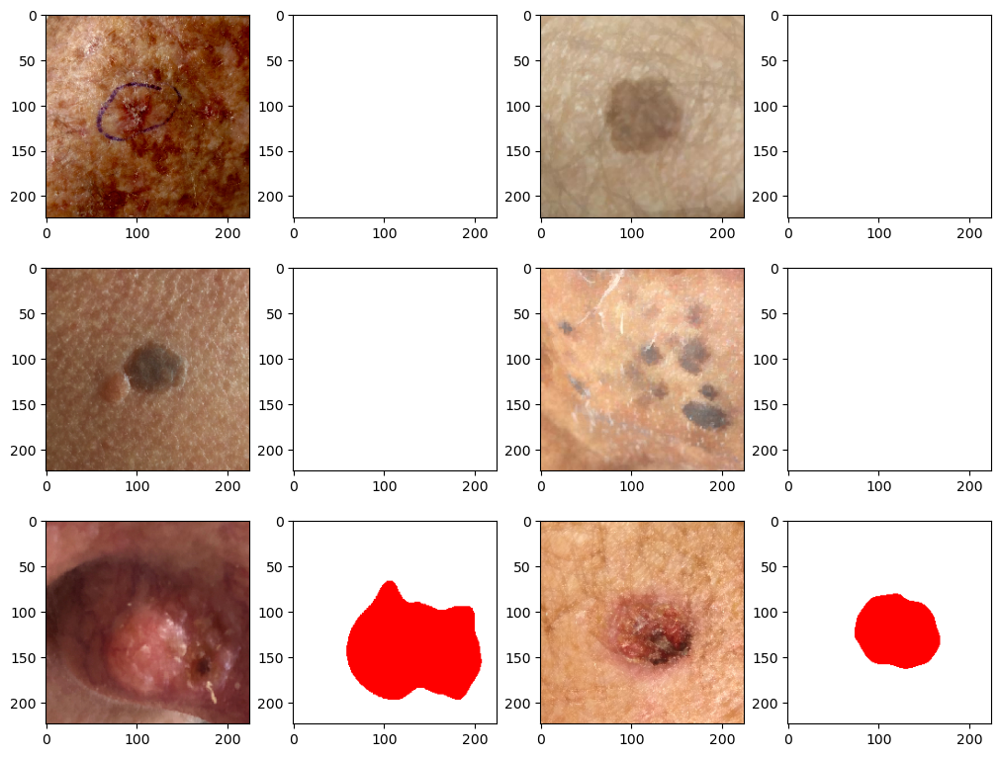

In [60]:
# display images from both training and test sets
display_count = 6
random_index = [np.random.randint(0, m) for _ in range(display_count)]
sample_images = [x for z in zip(list(X[random_index]), list(Y[random_index])) for x in z]
display_images(sample_images, rows=3)

In [61]:
# convert RGB values to ineger encoded labels for categorial_crossentropy
Y_unet = one_hot_encode_masks(Y, num_classes=n_classes)

100%|██████████| 2000/2000 [00:06<00:00, 286.02it/s]


In [62]:
# split dataset into training and test groups
X_train, X_test, Y_train, Y_test = train_test_split(X, Y_unet, test_size=0.2, random_state=42)

In [63]:
print('Amount of X_train data:', X_train.shape[0])
print('Amount of test data:', X_test.shape[0])

Amount of X_train data: 1600
Amount of test data: 400


In [64]:
# define U-Net model architecture
def build_unet(img_shape):
    # input layer shape is equal to patch image size
    inputs = Input(shape=img_shape)

    # rescale images from (0, 255) to (0, 1)
    rescale = Rescaling(scale=1. / 255, input_shape=(img_height, img_width, img_channels))(inputs)
    previous_block_activation = rescale  # Set aside residual

    contraction = {}
    # # Contraction path: Blocks 1 through 5 are identical apart from the feature depth
    for f in [16, 32, 64, 128]:
        x = Conv2D(f, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(previous_block_activation)
        x = Dropout(0.1)(x)
        x = Conv2D(f, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(x)
        contraction[f'conv{f}'] = x
        x = MaxPooling2D((2, 2))(x)
        previous_block_activation = x

    c5 = Conv2D(160, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(previous_block_activation)
    c5 = Dropout(0.2)(c5)
    c5 = Conv2D(160, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)
    previous_block_activation = c5

    # Expansive path: Second half of the network: upsampling inputs
    for f in reversed([16, 32, 64, 128]):
        x = Conv2DTranspose(f, (2, 2), strides=(2, 2), padding='same')(previous_block_activation)
        x = concatenate([x, contraction[f'conv{f}']])
        x = Conv2D(f, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(x)
        x = Dropout(0.2)(x)
        x = Conv2D(f, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(x)
        previous_block_activation = x

    outputs = Conv2D(filters=n_classes, kernel_size=(1, 1), activation="softmax")(previous_block_activation)

    return Model(inputs=inputs, outputs=outputs)

In [65]:
# build model
model_U = build_unet(img_shape=(img_height, img_width, img_channels))
model_U.summary()
model_U.compile(optimizer="adam", loss="categorical_crossentropy",
              metrics=["accuracy",jaccard_index])

Model: "model_17"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 224, 224, 16  448         ['rescaling[0][0]']              
                                )                                                                 
                                                                                           

In [66]:
# train and save model
history = model_U.fit(X_train, Y_train, epochs=50, batch_size=8, validation_data=(X_test, Y_test), callbacks=[checkpoint])

Epoch 1/50


2022-11-28 00:45:18.026397: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


200/200 [==============================] - ETA: 0s - loss: 0.3096 - accuracy: 0.9103 - jaccard_index: 0.7448

2022-11-28 00:45:56.818098: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.



Epoch 00001: val_accuracy improved from 0.86250 to 0.92777, saving model to ./Checkpoint/weights-01-0.93.hdf5
200/200 [==============================] - 43s 200ms/step - loss: 0.3096 - accuracy: 0.9103 - jaccard_index: 0.7448 - val_loss: 0.2701 - val_accuracy: 0.9278 - val_jaccard_index: 0.6885
Epoch 2/50
200/200 [==============================] - ETA: 0s - loss: 0.2377 - accuracy: 0.9250 - jaccard_index: 0.7890
Epoch 00002: val_accuracy did not improve from 0.92777
200/200 [==============================] - 39s 197ms/step - loss: 0.2377 - accuracy: 0.9250 - jaccard_index: 0.7890 - val_loss: 0.2415 - val_accuracy: 0.9278 - val_jaccard_index: 0.7235
Epoch 3/50
200/200 [==============================] - ETA: 0s - loss: 0.2270 - accuracy: 0.9251 - jaccard_index: 0.7950
Epoch 00003: val_accuracy improved from 0.92777 to 0.92804, saving model to ./Checkpoint/weights-03-0.93.hdf5
200/200 [==============================] - 40s 199ms/step - loss: 0.2270 - accuracy: 0.9251 - jaccard_index: 0.7

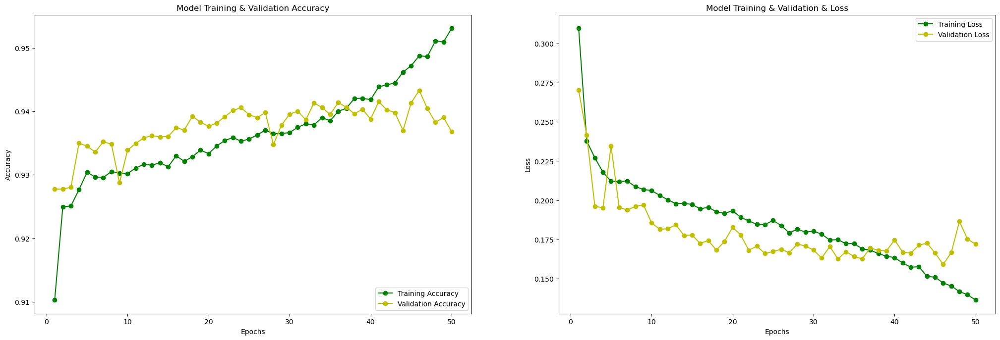

In [67]:
fig , ax = plt.subplots(1,2)
fig.set_size_inches(25,8)

train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

ax[0].plot(epochs , train_acc , 'g-o' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'y-o' , label = 'Validation Accuracy')
ax[0].set_title('Model Training & Validation Accuracy')
ax[0].legend(loc = 'lower right')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'y-o' , label = 'Validation Loss')
ax[1].set_title('Model Training & Validation & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [68]:
#Predict
def rgb_encode_mask(mask):
    # initialize rgb image with equal spatial resolution
    rgb_encode_image = np.zeros((mask.shape[0], mask.shape[1], 3))

    # iterate over MaskColorMap
    for j, cls in enumerate(MaskColorMap):
        # convert single integer channel to RGB channels
        rgb_encode_image[(mask == j)] = np.array(cls.value) / 255.
    return rgb_encode_image

2022-11-28 01:18:23.557513: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


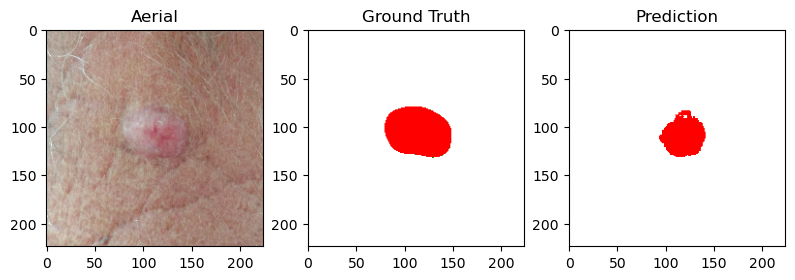

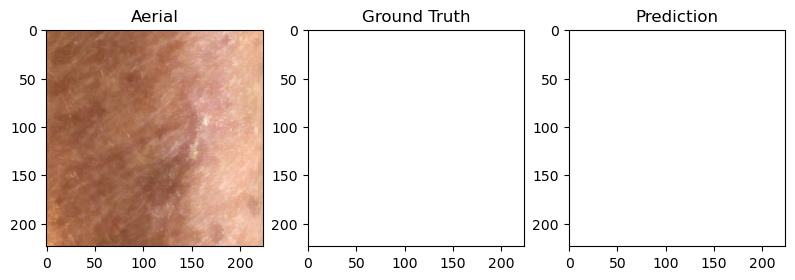

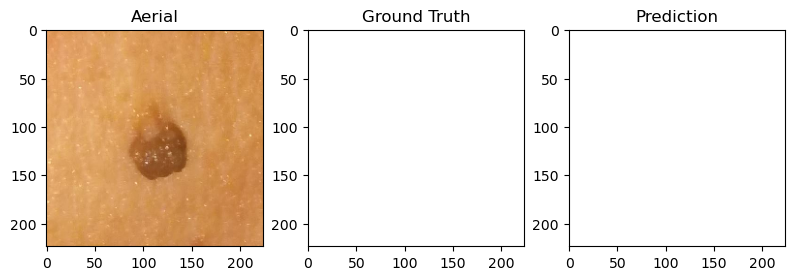

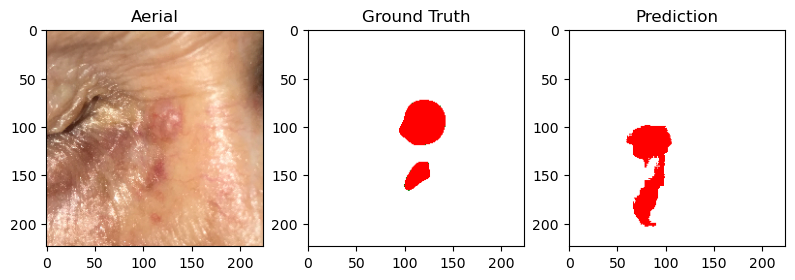

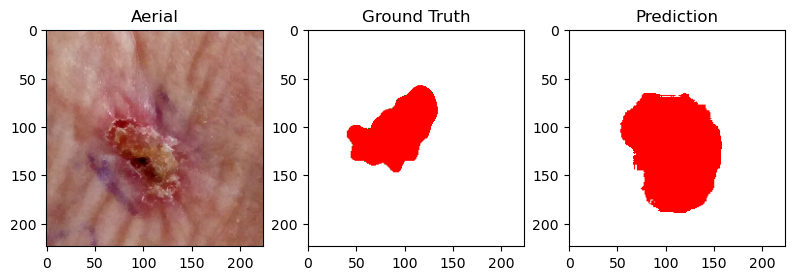

...

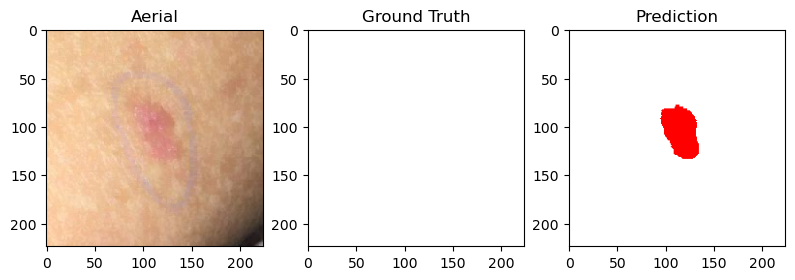

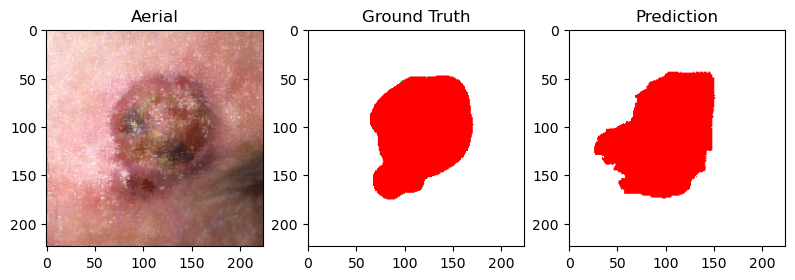

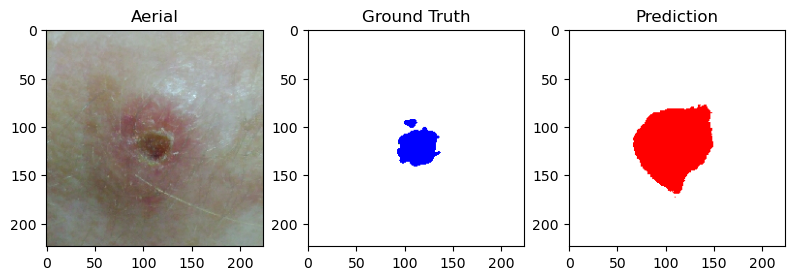

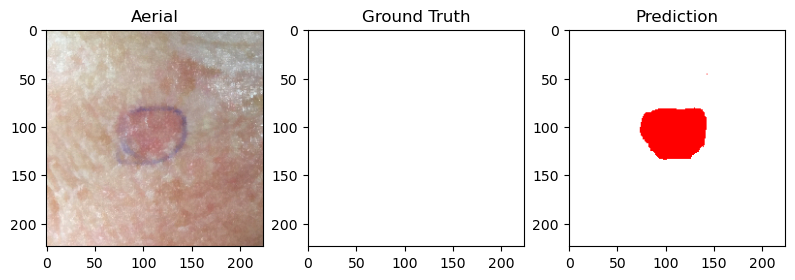

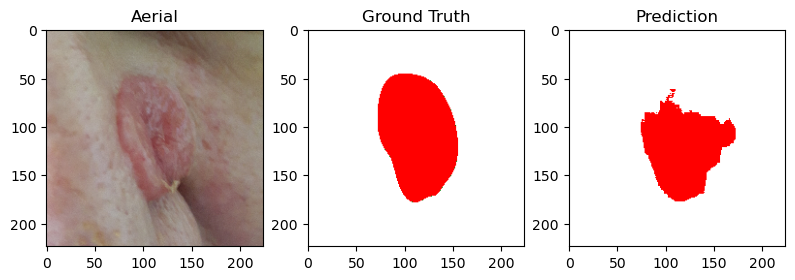

In [69]:
for _ in range(20):
    # choose random number from 0 to test set size
    test_img_number = np.random.randint(0, len(X_test))

    # extract test input image
    test_img = X_test[test_img_number]

    # ground truth test label converted from one-hot to integer encoding
    ground_truth = np.argmax(Y_test[test_img_number], axis=-1)

    # expand first dimension as U-Net requires (m, h, w, nc) input shape
    test_img_input = np.expand_dims(test_img, 0)

    # make prediction with model and remove extra dimension
    prediction = np.squeeze(model_U.predict(test_img_input))

    # convert softmax probabilities to integer values
    predicted_img = np.argmax(prediction, axis=-1)

    # convert integer encoding to rgb values
    rgb_image = rgb_encode_mask(predicted_img)
    rgb_ground_truth = rgb_encode_mask(ground_truth)

    # visualize model predictions
    display_images(
        [test_img, rgb_ground_truth, rgb_image],
        rows=1, titles=['Aerial', 'Ground Truth', 'Prediction']
    )